In [1]:
import plotly.graph_objs as go
import plotly.io as pio
import plotly.express as px
import pandas as pd
import matplotlib.pyplot as plt
import plotly.offline as py
py.init_notebook_mode(connected=True)

pio.renderers.default = 'vscode'



In [2]:
ds1 = pd.read_csv("covid.csv")
ds2= pd.read_csv("covid_grouped.csv")
ds3 = pd.read_csv("coviddeath.csv")

#ds1.shape

In [3]:
ds1.head()

,Country/Region,Continent,Population,TotalCases,NewCases,TotalDeaths,NewDeaths,TotalRecovered,NewRecovered,ActiveCases,"Serious,Critical",Tot Cases/1M pop,Deaths/1M pop,TotalTests,Tests/1M pop,WHO Region,iso_alpha
0,USA,North America,3.311981e+08,5032179,NaN,162804.0,NaN,2576668.0,NaN,2292707.0,18296.0,15194.0,492.0,63139605.0,190640.0,Americas,USA
1,Brazil,South America,2.127107e+08,2917562,NaN,98644.0,NaN,2047660.0,NaN,771258.0,8318.0,13716.0,464.0,13206188.0,62085.0,Americas,BRA
2,India,Asia,1.381345e+09,2025409,NaN,41638.0,NaN,1377384.0,NaN,606387.0,8944.0,1466.0,30.0,22149351.0,16035.0,South-EastAsia,IND
3,Russia,Europe,1.459409e+08,871894,NaN,14606.0,NaN,676357.0,NaN,180931.0,2300.0,5974.0,100.0,29716907.0,203623.0,Europe,RUS
4,South Africa,Africa,5.938157e+07,538184,NaN,9604.0,NaN,387316.0,NaN,141264.0,539.0,9063.0,162.0,3149807.0,53044.0,Africa,ZAF


In [4]:
ds2.head()

,Date,Country/Region,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,WHO Region,iso_alpha
0,2020-01-22,Afghanistan,0,0,0,0,0,0,0,Eastern Mediterranean,AFG
1,2020-01-22,Albania,0,0,0,0,0,0,0,Europe,ALB
2,2020-01-22,Algeria,0,0,0,0,0,0,0,Africa,DZA
3,2020-01-22,Andorra,0,0,0,0,0,0,0,Europe,AND
4,2020-01-22,Angola,0,0,0,0,0,0,0,Africa,AGO


In [5]:
ds3.head()

,Data as of,Start Week,End Week,State,Condition Group,Condition,ICD10_codes,Age Group,Number of COVID-19 Deaths,Flag
0,08/30/2020,02/01/2020,08/29/2020,US,Respiratory diseases,Influenza and pneumonia,J09-J18,0-24,122.0,NaN
1,08/30/2020,02/01/2020,08/29/2020,US,Respiratory diseases,Influenza and pneumonia,J09-J18,25-34,596.0,NaN
2,08/30/2020,02/01/2020,08/29/2020,US,Respiratory diseases,Influenza and pneumonia,J09-J18,35-44,1521.0,NaN
3,08/30/2020,02/01/2020,08/29/2020,US,Respiratory diseases,Influenza and pneumonia,J09-J18,45-54,4186.0,NaN
4,08/30/2020,02/01/2020,08/29/2020,US,Respiratory diseases,Influenza and pneumonia,J09-J18,55-64,10014.0,NaN


In [6]:

ds3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12260 entries, 0 to 12259
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Data as of                 12260 non-null  object 
 1   Start Week                 12260 non-null  object 
 2   End Week                   12260 non-null  object 
 3   State                      12260 non-null  object 
 4   Condition Group            12260 non-null  object 
 5   Condition                  12260 non-null  object 
 6   ICD10_codes                12260 non-null  object 
 7   Age Group                  12260 non-null  object 
 8   Number of COVID-19 Deaths  5354 non-null   float64
 9   Flag                       6906 non-null   object 
dtypes: float64(1), object(9)
memory usage: 957.9+ KB


In [7]:
ds3['Number of COVID-19 Deaths'].sum()

np.float64(2569177.0)

In [8]:

ds1.drop(['NewCases','NewDeaths','NewRecovered'],axis=1,inplace=True)


In [9]:
ds1.columns

Index(['Country/Region', 'Continent', 'Population', 'TotalCases',
       'TotalDeaths', 'TotalRecovered', 'ActiveCases', 'Serious,Critical',
       'Tot Cases/1M pop', 'Deaths/1M pop', 'TotalTests', 'Tests/1M pop',
       'WHO Region', 'iso_alpha'],
      dtype='object')

In [10]:
from plotly.figure_factory import create_table

colorscale = [[0, '#4d004c'], [.5, '#f2e5ff'], [1, '#ffffff']]
table = create_table(ds1.head(15), colorscale=colorscale)
py.iplot(table)

In [11]:
px.bar(ds1.head(15), x = 'Country/Region', 
       y = 'TotalCases',color = 'TotalCases', 
       height = 500,hover_data = ['Country/Region', 'Continent'])

In [12]:
px.bar(ds1.head(15),x='Country/Region',y='TotalCases',color = 'TotalDeaths',height=500,hover_data=['Country/Region','Continent'])

In [13]:
px.bar(ds1.head(15),x='Country/Region',y='TotalCases',height=500,color='TotalRecovered',hover_data=['Country/Region','Continent'])

In [14]:
px.bar(ds1.head(30),x='Country/Region',y='TotalCases',height = 500,color='TotalTests',hover_data=['Country/Region','Continent'])

In [15]:
px.bar(ds1.head(30),x='TotalCases',y='Country/Region',height = 500,orientation='h', color='TotalTests',hover_data=['Country/Region','Continent'])

In [16]:
px.bar(ds1.head(30),x='TotalTests',y='Country/Region',height = 500,orientation='h', color='TotalTests',hover_data=['Country/Region','Continent'])

In [17]:
px.scatter(ds1, x='Continent',y='TotalCases',hover_data=['Country/Region','Continent'],color='TotalCases',size='TotalCases',size_max=100)

In [18]:
px.scatter(ds1.head(50), x='Continent',y='TotalTests',hover_data=['Country/Region','Continent'],color='TotalTests',size='TotalTests',size_max=100,log_y=True)

In [19]:
px.scatter(ds1.head(50), x='Continent',y='TotalTests',hover_data=['Country/Region','Continent'],color='TotalTests',size='TotalTests',size_max=100)

In [20]:
px.scatter(ds1.head(50), x='Country/Region',y='TotalTests',hover_data=['Country/Region','Continent'],color='TotalTests',size='TotalTests',size_max=100,log_y=True)

In [21]:
px.scatter(ds1.head(50), x='Country/Region',y='TotalTests',hover_data=['Country/Region','Continent'],color='TotalTests',size='TotalTests',size_max=100)

In [22]:
px.scatter(ds1.head(50), x='Country/Region',y='TotalCases',hover_data=['Country/Region','Continent'],color='TotalCases',size='TotalCases',size_max=100,log_y=True)

In [23]:
px.scatter(ds1.head(50),x='Country/Region',y='TotalDeaths',hover_data=['Country/Region','Continent'],color='Country/Region', size= 'TotalDeaths', size_max=80,log_y=True)

In [24]:
px.scatter(ds1.head(50), x='Country/Region', y= 'Tests/1M pop', 
           hover_data=['Country/Region', 'Continent'],
           color='Tests/1M pop', size= 'Tests/1M pop', size_max=80,log_y=True)


In [25]:
px.bar(ds2,x='Date',y='Confirmed',color='Confirmed',hover_data=['Confirmed','Date','Country/Region'],height=400,log_y=True)

In [28]:
#step 8
df_us = ds2.loc[ds2["Country/Region"] == "US"]
px.bar(df_us,x="Date",y='Confirmed',height=400,color = "Confirmed")

In [29]:
px.line(df_us,x="Date",y="Deaths",height=400)

In [31]:
px.bar(df_us,x="Date",y="New cases",height=400)

In [34]:
px.scatter(df_us,x="Confirmed",y="Deaths",height=500)

In [37]:
px.choropleth(ds2, locations="iso_alpha", color="Confirmed", hover_name="Country/Region", color_continuous_scale="Blues",animation_frame="Date")


In [38]:
px.choropleth(ds2, locations="iso_alpha", color="Deaths", hover_name="Country/Region", color_continuous_scale="Viridis",animation_frame="Date")


In [39]:
px.choropleth(ds2, locations="iso_alpha", color="Deaths",projection="natural earth", hover_name="Country/Region", color_continuous_scale="Blues",animation_frame="Date")


In [41]:
px.bar(ds2, x="WHO Region", y="Confirmed", color="WHO Region", 
       animation_frame="Date", hover_name="Country/Region")

In [42]:
ds3.groupby(["Condition"]).count()

,Data as of,Start Week,End Week,State,Condition Group,ICD10_codes,Age Group,Number of COVID-19 Deaths,Flag
Condition,,,,,,,,,
Adult respiratory distress syndrome,540,540,540,540,540,540,540,272,268
All other conditions and causes (residual),540,540,540,540,540,540,540,363,177
Alzheimer disease,530,530,530,530,530,530,530,144,386
COVID-19,540,540,540,540,540,540,540,377,163
Cardiac arrest,520,520,520,520,520,520,520,219,301
Cardiac arrhythmia,540,540,540,540,540,540,540,192,348
Cerebrovascular diseases,530,530,530,530,530,530,530,187,343
Chronic lower respiratory diseases,540,540,540,540,540,540,540,229,311
Diabetes,540,540,540,540,540,540,540,276,264


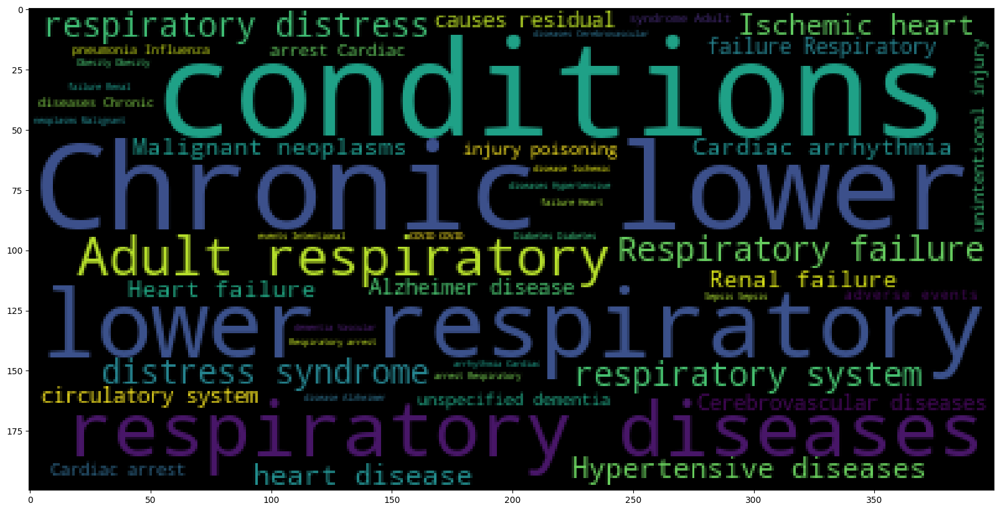

In [43]:
from wordcloud import WordCloud
sentences = ds3["Condition"].tolist()
sentences_as_string = ' '.join(sentences)

plt.figure(figsize=(20,20))
plt.imshow(WordCloud().generate(sentences_as_string))

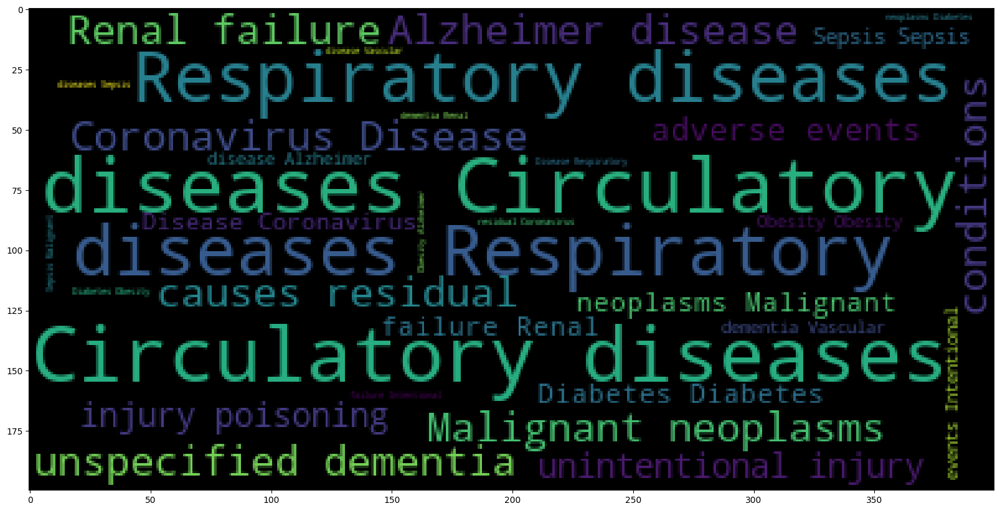

In [44]:
column2_tolist = ds3["Condition Group"].tolist()
col_to_str = " ".join(column2_tolist)

plt.figure(figsize=(20,20))
plt.imshow(WordCloud().generate(col_to_str))